# _MIMI'S WORLD:_ a CA simulating a world

## Import(ant) and more

In [1]:
%matplotlib inline  
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import random
import copy
import math
degree_sign = u'\N{DEGREE SIGN}'
size = 6


## Creating classes for the project
Here we have a _CellsMatrix_ class, a _Cell_ class and classes for three of the parameters in cells: the _Pollution,_ _Wind_ and _Cloud_ classes

In [2]:
class CellsMatrix:
    _directions_options = ("C","N","NE","E","SE","S","SW","W","NW")
    def __init__(self, size):
        self._x_size = size
        self._y_size = size
        self.matrix = []
        for i in range(size):
            row = []
            for j in range(size):
                row += [Cell(size,i,j)]
            self.matrix += [row]

        
    def get_neighborhood(self, cell):
        x = cell.x
        y = cell.y
        
        nd = {}
        result = {}
        nd["C"] = cell
        
        if y < self._y_size-1:
            nd["N"] = self.matrix[cell.x][cell.y+1]
            if x < self._x_size-1:
                nd["NE"] = self.matrix[cell.x+1][cell.y+1]
            if x > 0:
                nd["NW"] = self.matrix[cell.x-1][cell.y+1]  

        if y > 0:
            nd["S"] = self.matrix[cell.x][cell.y-1]
            if x < self._x_size-1:
                nd["SE"] = self.matrix[cell.x+1][cell.y-1]
            if x > 0:
                nd["SW"] = self.matrix[cell.x-1][cell.y-1]
            
        if x < self._x_size-1:
            nd["E"] = self.matrix[cell.x+1][cell.y]
        
        if x > 0:
            nd["W"] = self.matrix[cell.x-1][cell.y]

        for dire, n in nd.items():
            if n.surface != "dead":
                result[dire] = n

        return result             
                
#-------------------------------------------------------------------------------------------------------------------------#            
class Cell:
    _surface_options = ("land","sea","iceberg","forest","city")
    _global_x = 0
    _global_y = 0
    
    def __init__(self, size, x, y, *args):
        

        if x >= size:
            raise Exception("wrong x")
        if y == size:
            raise Exception("wrong y")
            
        self.x = x
        self.y = y
        

        self.surface = random.choice(self._surface_options)
        self.height = 0
        self.temp = 0
        self.wind = Wind()
        self.cloud = Cloud()
        self.pollution = Pollution()
        
        if len(args) > 0:
            self.surface = surface
#-------------------------------------------------------------------------------------------------------------------------#            
class Cloud:
    _max = 6
    
    def __init__(self):
        self.state = 0
    
    def exists(self):
        if self.state > 0:
            return True
        else:
            return False
    
    def is_raining(self):
        return True if (self.state == Cloud._max) else False
    
    def grow(self):
        self.state = 0 if (self.state == Cloud._max) else self.state+1
        
    def increase(self, amount):
        new_state = self.state + amount
        self.state = new_state if new_state <= Cloud._max else Cloud._max
        
    def reduce(self, amount):
        new_state = self.state - amount
        self.state = new_state if new_state >= 0 else 0
#-------------------------------------------------------------------------------------------------------------------------#            
class Wind:
    
    def __init__(self):
        self.direction = "C"
        self.velocity = 0
    
    def calculate_direction(self, neighborhood):
        cell = neighborhood["C"]
        score = 0
        max_score = score
        
        for direction_option, cell in neighborhood.items():
            score = cell.height/(size*2-2) + abs(cell.temp)/100
            if score >= max_score:
                max_score = score
                self.direction = direction_option 
                
    def calculate_velocity(self, neighborhood):
        self.velocity = int(math.ceil((abs(neighborhood[self.direction].height - neighborhood["C"].height) //3)))
#-------------------------------------------------------------------------------------------------------------------------#            
class Pollution:
    _max = 6
    
    def __init__(self):
        self.level = 0
        
    def reduce(self, amount):
        new_level = self.level - amount
        self.level = new_level if new_level >= 0 else 0
        
    def increase(self, amount):
        new_level = self.level + amount
        self.level = new_level if new_level <= self._max else self._max
        

                


        
                
        
                
    

## Presentation
First, Random

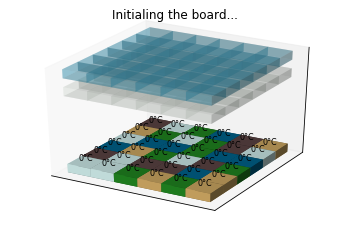

In [3]:
#for the CA to be interactive (movable by clicking and dragging)
#%matplotlib inline 

surface_colors = {"land":"#d9b168",
                  "sea":"#006994",
                  "iceberg":"#d9f8f6",
                  "forest":"#228b22",
                  "city":"#604848",
                  "dead":"#000000"}

cloud_colors = {0:"#44a6c650",
                1:"#62b4cf50",
                2:"#80c3d850",
                3:"#9ed1e150",
                4:"#bcdfeb50",
                5:"#daedf450",
                6:"#f8fcfd50"}

pollu_colors = {0:"#f6fef650",
                1:"#d4f8d450",
                2:"#b2f3b250",
                3:"#90ee9050",
                4:"#6ee96e50",
                5:"#4ce44c50",
                6:"#2ade2a50"}


# prepare some coordinates
x, y, z = np.indices((size, size, size*2))

ax = plt.figure().add_subplot(projection='3d')

#creating initial (random) layers
cells = CellsMatrix(size)

#plotting initial (random) layers
for row in cells.matrix:
    for cell in row:

        cube = (x == cell.x) & (y == cell.y) & (z <=cell.height)
        ax.voxels(cube, facecolors=surface_colors[cell.surface], edgecolor='#9ed1e100')
        ax.text(cell.x+0.5,cell.y+0.5,cell.height+1.5,str(cell.temp)+degree_sign+"C", size = 8, zorder=8000, ha='center', va='center')

        skycube = (x == cell.x) & (y == cell.y) & (z == (size*2)-1)
        ax.voxels(skycube, facecolors=cloud_colors[cell.cloud.state], edgecolor='#9ed1e100') #create the dict for cloud colors

        pollucube = (x == cell.x) & (y == cell.y) & (z == (size*2)-3)
        ax.voxels(pollucube, facecolors=pollu_colors[cell.pollution.level], edgecolor='#9ed1e100') #create the dict for pollu colors

#hiding axis
ax.axes.xaxis.set_visible(False)
ax.axes.zaxis.set_visible(False)
ax.axes.yaxis.set_visible(False) #to Hide Matplotlib Axis Including Axis label.
ax.axes.xaxis.set_ticks([])
ax.axes.zaxis.set_ticks([])
ax.axes.yaxis.set_ticks([]) #to Hide Axis in Matplotlib.
ax.axes.xaxis.set_ticklabels([])
ax.axes.zaxis.set_ticklabels([])
ax.axes.yaxis.set_ticklabels([]) #to Hide Axis Label / Text in Matplotlib.
ax.set_title("Initializing the board...")


plt.show()

### Alterations

In [4]:
version = 3
cities = [{2:4},{3:2}]
for row in cells.matrix:
    for cell in row:
        if version == 3:
            cell.pollution.level = 1
            if cell.x == 0 or cell.y == 0 or cell.x == size-1 or cell.y == size-1:
                cell.surface = "sea"
                cell.temp = 25 #random.choice(range(23,28))
            elif {cell.x:cell.y} in cities:
                cell.surface = "city"
                cell.temp = 25
                cell.height = 1 
            else:
                cell.surface = "forest"
                cell.temp = 25
                cell.height = 3
            if (cell.x == 0 and cell.y == 0):
                cell.surface = "iceberg"
                cell.temp = -10
                cell.height = 1
            if cell.x == 2 and cell.y == 3:
                cell.height = 4
            if cell.x == 4 and cell.y == 4:
                cell.surface = "land"
                cell.temp = 15
            if cell.x == 2 and cell.y == 0:
                cell.surface = "land"
            if cell.x == 1 and cell.y == 2:
                cell.surface = "land"
            if cell.x == 2 and cell.y == 5:
                cell.surface = "iceberg"
                cell.temp = -5
                cell.height = 5
            
        if version == 2:
            if cell.surface == "city":
                nd = cells.get_neighborhood(cell)
                i = 0
                for dire, n in nd.items():
                    i += 1
                    if dire == "C": continue
                    if (i % 2) == 0:
                        n.surface = "forest"
                cell.height = 4 #random.choice(range(4))
                cell.temp = random.choice(range(30,40))
                
for row in cells.matrix:
    for cell in row:
        if version == 2:
            if cell.surface == "iceberg":
                cell.temp = random.choice(range(-20,-10))
                cell.height = 8 #random.choice(range(8))
            if cell.surface == "sea":
                cell.temp = 25
            if cell.surface == "forest":
                cell.height = 5 #random.choice(range(3,7))
                cell.temp = random.choice(range(10,20))
            if cell.surface == "land":
                cell.height = 4 #random.choice(range(6))
                cell.temp = random.choice(range(20,30))
            
            
            
        cube = (x == cell.x) & (y == cell.y) & (z <= cell.height)
        ax.voxels(cube, facecolors=surface_colors[cell.surface], edgecolor='#9ed1e100')
        ax.text(cell.x+0.5,cell.y+0.5,cell.height+1.5,str(cell.temp)+degree_sign+"C", size = 8, zorder=8000, ha='center', va='center')


## Plotting inital (altered) configuration

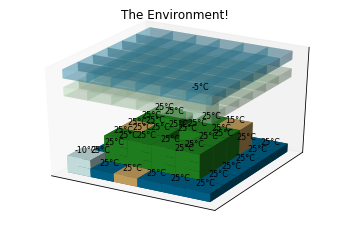

In [5]:
 

import matplotlib.pyplot as plt
ax = plt.figure().add_subplot(projection='3d')

for row in cells.matrix:
    for cell in row:
            
        cube = (x == cell.x) & (y == cell.y) & (z <= cell.height)
        ax.voxels(cube, facecolors=surface_colors[cell.surface], edgecolor='#9ed1e100')
        ax.text(cell.x+0.5,cell.y+0.5,cell.height+1.5,str(cell.temp)+degree_sign+"C", size = 8, zorder=8000, ha='center', va='center')

        skycube = (x == cell.x) & (y == cell.y) & (z == (size*2)-1)
        ax.voxels(skycube, facecolors=cloud_colors[cell.cloud.state], edgecolor='#9ed1e100') #create the dict for cloud colors
        
        pollucube = (x == cell.x) & (y == cell.y) & (z == (size*2)-3)
        ax.voxels(pollucube, facecolors=pollu_colors[cell.pollution.level], edgecolor='#9ed1e100') #create the dict for pollu colors

ax.axes.xaxis.set_visible(False)
ax.axes.zaxis.set_visible(False)
ax.axes.yaxis.set_visible(False) #to Hide Matplotlib Axis Including Axis label.
ax.axes.xaxis.set_ticks([])
ax.axes.zaxis.set_ticks([])
ax.axes.yaxis.set_ticks([]) #to Hide Axis in Matplotlib.
ax.axes.xaxis.set_ticklabels([])
ax.axes.zaxis.set_ticklabels([])
ax.axes.yaxis.set_ticklabels([]) #to Hide Axis Label / Text in Matplotlib.
ax.set_title("The Environment!")


plt.show()
old_cells = cells

## Transition Rules and Development over the Year

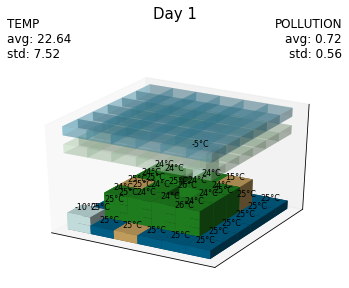

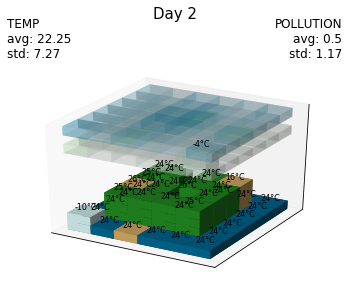

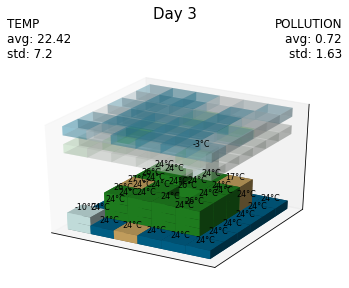

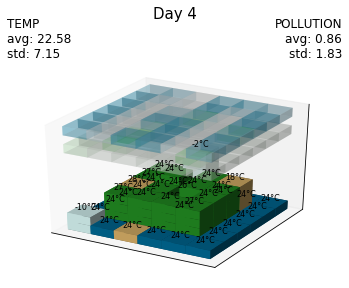

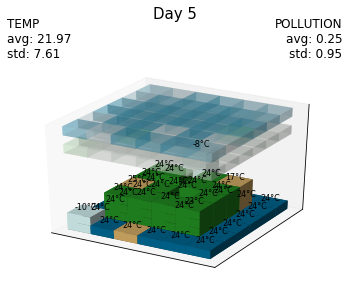

...

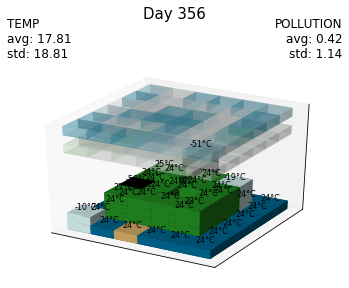

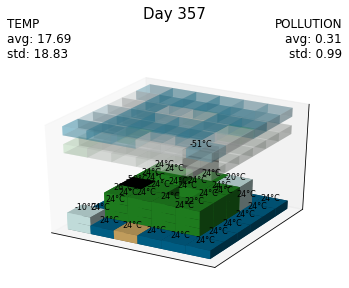

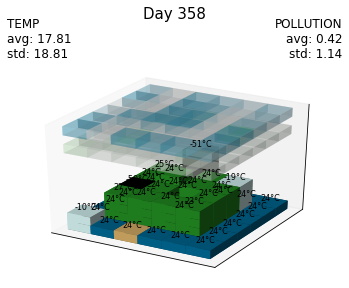

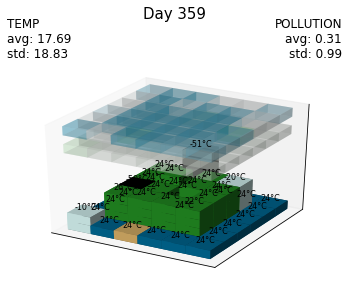

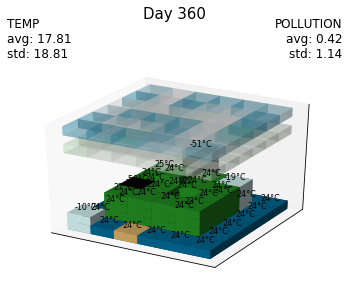

In [6]:
%matplotlib inline  
import matplotlib.pyplot as plt


temp_avg = []
pollu_avg = []
clouds_avg = []
height_avg = []
velocity_avg = []
deads_avg = []


temp_std = []
pollu_std = []
clouds_std = []
height_std = []
velocity_std = []
deads_std = []



opposite_directions = {"N":["S","SE","SW"],
                       "NE":["SW","S","W"],
                       "E":["W","SW","NW"],
                       "SE":["NW","N","W"],
                       "S":["N","NE","NW"],
                       "SW":["NE","N","E"],
                       "W":["E","NE","SE"],
                       "NW":["SE","S","E"]}
melting_point = 0
boiling_point = 100

for gen in range(360):

    new_cells = copy.deepcopy(old_cells)
    for i in range(size):
        for j in range(size):
            new_pollution = 0
            old_cell = old_cells.matrix[i][j]
            if old_cell.surface == "dead":
                continue
            new_cell = new_cells.matrix[i][j]
            neighborhood = old_cells.get_neighborhood(old_cell)
         
            new_cell.wind.calculate_direction(neighborhood) 
            new_cell.wind.calculate_velocity(neighborhood)
  
            #move cloud and pollution with wind **from this cell** (AWAY)
            if old_cell.wind.direction != "C":
                new_pollution -= old_cell.wind.velocity*3
                new_cell.cloud.reduce(old_cell.wind.velocity)

            #move cloud and pollution with wind **from neighbors** (RECIEVE)
            for location, neighbor in neighborhood.items():
                if location == "C": continue
                if neighbor.wind.direction != "C":
                    if neighbor.wind.velocity > 0:
                        if neighbor.wind.direction in opposite_directions[location]: #meaning its wind is in our direction
                            new_pollution += neighbor.wind.velocity
                            new_cell.cloud.increase(neighbor.cloud.state) 

                #icebergs flood lands if their temp is too high
                #our world doesnt support Communicating vessels and we are proud of it (;
                if neighbor.surface == "iceberg" and neighbor.temp >= melting_point:
                    if old_cell.height == 0 and old_cell.surface != "sea" and old_cell.surface != "iceberg":
                        new_cell.surface == "sea"


            #cities pollut their air
            if old_cell.surface == "city":
                new_pollution += 1


            #forests are the green lung of nature: absorbing pollution
            if old_cell.surface == "forest":
                new_pollution -= 3

            #creation of clouds
            if old_cell.surface == "sea":
                if old_cell.temp >= boiling_point:
                    new_cell.surface = "land"
                if old_cell.temp >= 25:
                    new_cell.cloud.grow()
                if old_cell.temp < 0:
                    new_cell.surface = "iceberg"

            #melting icebergs
            if old_cell.surface == "iceberg" and old_cell.temp > melting_point:
                if old_cell.height >= 1:
                    new_cell.height -= 1
                else:
                    new_cell.surface = "sea"

            if old_cell.surface != "sea" and old_cell.surface != "iceberg":
                for location, neighbor in neighborhood.items():
                    if location == "C": continue
                    if neighbor.surface == "iceberg" and neighbor.temp >= melting_point:
                        if neighbor.height >= old_cell.height+1:
                            new_cell.surface = "sea"
            if old_cell.temp < 0:
                new_cell.surface = "iceberg"
                            
            #cloud
            if old_cell.cloud.is_raining():
                new_pollution -= 6
            if old_cell.cloud.exists():
                new_cell.cloud.grow()
            
            if new_pollution > 0:
                new_cell.pollution.increase(new_pollution)
            if new_pollution < 0:
                new_cell.pollution.reduce(abs(new_pollution))
                
            
            
            if old_cell.pollution.level > new_cell.pollution.level:
                new_cell.temp -= (old_cell.pollution.level-new_cell.pollution.level)
            else:
                if old_cell.pollution.level < new_cell.pollution.level:
                    new_cell.temp += 1
                else:
                    if new_cell.pollution.level == 6:
                        new_cell.temp += 1
                        
            if new_cell.temp >= 100 or new_cell.temp <= -50:
                new_cell.surface = "dead"
            
                
                        
#########################plotting this day/generation######################################################################                    


    if (gen % 1) == 0:
        ax = plt.figure().add_subplot(projection='3d')
        temps_for_gen = []
        pollu_for_gen = []
        clouds_for_gen = []
        height_for_gen = []
        velocity_for_gen = []
        deads_for_gen = []
        
        for row in new_cells.matrix:
            for cell in row:
                temps_for_gen += [cell.temp]
                pollu_for_gen += [cell.pollution.level]
                clouds_for_gen += [cell.cloud.state]
                height_for_gen += [cell.height]
                velocity_for_gen += [cell.wind.velocity]
                
                if cell.surface == "dead":
                    deads_for_gen += [1]
                else:
                    deads_for_gen += [0]
                                    
                skycube = (x == cell.x) & (y == cell.y) & (z == (size*2)-1)
                ax.voxels(skycube, facecolors=cloud_colors[cell.cloud.state], edgecolor='#9ed1e100') #create the dict for cloud colors        

                pollucube = (x == cell.x) & (y == cell.y) & (z == (size*2)-3) 
                ax.voxels(pollucube, facecolors=pollu_colors[cell.pollution.level], edgecolor='#9ed1e100') #create the dict for pollu colors


                cube = (x == cell.x) & (y == cell.y) & (z <= cell.height) 
                ax.voxels(cube, facecolors=surface_colors[cell.surface], edgecolor='#9ed1e100')
                ax.text(cell.x+0.5,cell.y+0.5,cell.height+1.5,str(cell.temp)+degree_sign+"C", size = 8, zorder=8000, ha='center', va='center')
        temp_avg += [sum(temps_for_gen)/len(temps_for_gen)]
        temp_std += [np.std(temps_for_gen)]
        
        pollu_avg += [sum(pollu_for_gen)/len(pollu_for_gen)]
        pollu_std += [np.std(pollu_for_gen)]
        
        clouds_avg += [sum(clouds_for_gen)/len(clouds_for_gen)]
        clouds_std += [np.std(clouds_for_gen)]
        
        height_avg += [sum(height_for_gen)/len(height_for_gen)]
        height_std += [np.std(height_for_gen)]
        
        velocity_avg += [sum(velocity_for_gen)/len(velocity_for_gen)]
        velocity_std += [np.std(velocity_for_gen)]
        
        deads_avg += [sum(deads_for_gen)/len(deads_for_gen)]
        deads_std += [np.std(deads_for_gen)]
        
        plt.title('TEMP\navg: '+str(round(temp_avg[gen],2))+"\nstd: "+str(round(temp_std[gen],2)), loc='left')
        plt.title('POLLUTION\navg: '+str(round(pollu_avg[gen],2))+"\nstd: "+str(round(pollu_std[gen],2)), loc='right')
        ax.axes.xaxis.set_visible(False)
        ax.axes.zaxis.set_visible(False)
        ax.axes.yaxis.set_visible(False) #to Hide Matplotlib Axis Including Axis label.
        ax.axes.xaxis.set_ticks([])
        ax.axes.zaxis.set_ticks([])
        ax.axes.yaxis.set_ticks([]) #to Hide Axis in Matplotlib.
        ax.axes.xaxis.set_ticklabels([])
        ax.axes.zaxis.set_ticklabels([])
        ax.axes.yaxis.set_ticklabels([]) #to Hide Axis Label / Text in Matplotlib.
        plt.title('Day '+str(gen+1)+"\n\n\n\n\n", loc = "center", fontdict = {'fontsize': 15})


        plt.show()
        

    
        
    old_cells = copy.deepcopy(new_cells)



In [16]:


    
    
temp_avg = [round(item,6) for item in temp_avg]
temp_std = [round(item,6) for item in temp_std]
        
pollu_avg = [round(item,6) for item in pollu_avg]
pollu_std = [round(item,6) for item in pollu_std]
        
clouds_avg = [round(item,6) for item in clouds_avg]
clouds_std = [round(item,6) for item in clouds_std]
        
height_avg = [round(item,6) for item in height_avg]
height_std = [round(item,6) for item in height_std]
        
velocity_avg = [round(item,6) for item in velocity_avg]
velocity_std = [round(item,6) for item in velocity_std]
        
deads_avg = [round(item,6) for item in deads_avg]
deads_std = [round(item,6) for item in deads_std]


## Showing off the final day interactively(;

<IPython.core.display.Javascript object>


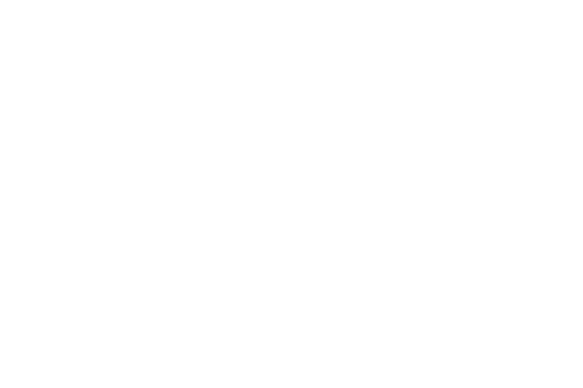

1,2 height: 3
2,5 height: 5


In [8]:
%matplotlib notebook  
%matplotlib notebook 
%matplotlib notebook  
%matplotlib notebook 
import matplotlib.pyplot as plt
deads = []
ax = plt.figure().add_subplot(projection='3d')
for row in new_cells.matrix:
    for cell in row:
        
        if cell.surface == "dead":
            print (str(cell.x)+","+str(cell.y)+" height: "+str(cell.height))
            deads += [{cell.x:cell.y}]

        skycube = (x == cell.x) & (y == cell.y) & (z == (size*2)-1)
        ax.voxels(skycube, facecolors=cloud_colors[cell.cloud.state], edgecolor='#9ed1e100') #create the dict for cloud colors        

        pollucube = (x == cell.x) & (y == cell.y) & (z == (size*2)-3) 
        ax.voxels(pollucube, facecolors=pollu_colors[cell.pollution.level], edgecolor='#9ed1e100') #create the dict for pollu colors


        cube = (x == cell.x) & (y == cell.y) & (z <= cell.height) 
        ax.voxels(cube, facecolors=surface_colors[cell.surface], edgecolor='#9ed1e100')
        ax.text(cell.x+0.5,cell.y+0.5,cell.height+1.5,str(cell.temp)+degree_sign+"C", size = 8, zorder=8000, ha='center', va='center')


ax.axes.xaxis.set_visible(False)
ax.axes.zaxis.set_visible(False)
ax.axes.yaxis.set_visible(False) #to Hide Matplotlib Axis Including Axis label.
ax.axes.xaxis.set_ticks([])
ax.axes.zaxis.set_ticks([])
ax.axes.yaxis.set_ticks([]) #to Hide Axis in Matplotlib.
ax.axes.xaxis.set_ticklabels([])
ax.axes.zaxis.set_ticklabels([])
ax.axes.yaxis.set_ticklabels([]) #to Hide Axis Label / Text in Matplotlib.


plt.show()

## Plotting the parameters

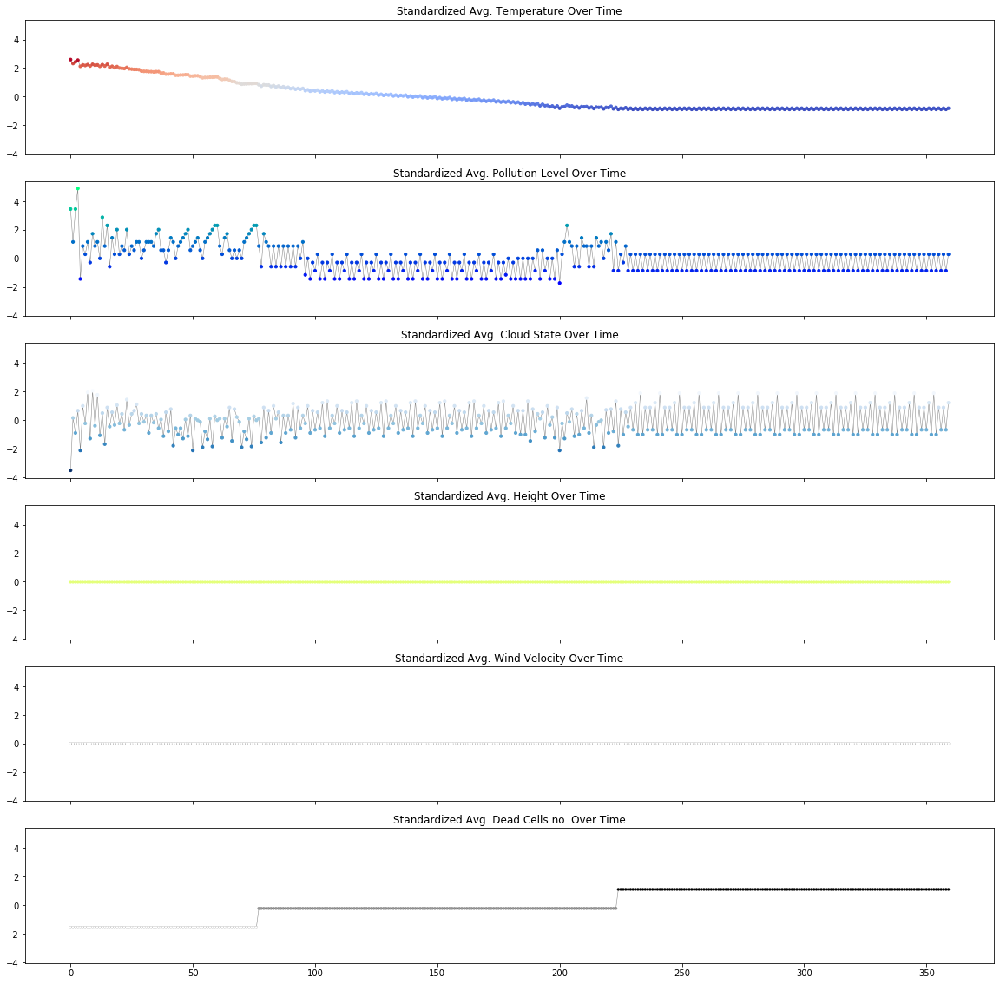

In [19]:

%matplotlib inline  

import matplotlib.pyplot as plt

f, axs = plt.subplots(6, 1, sharex = True, sharey = True)
f.set_size_inches(20, 20)
          

yearly_temp_avg = sum(temp_avg)/len(temp_avg)
yearly_temp_std = np.std(temp_avg)

temp_graph = [(num-yearly_temp_avg)/yearly_temp_std for num in temp_avg]

x = range(len(temp_graph))
axs[0].plot(temp_graph, c="gray", linewidth = 0.5 ,zorder=1)
axs[0].scatter(x,temp_graph,s=10, c=temp_graph, zorder=2, cmap="coolwarm")
axs[0].set_title("Standardized Avg. Temperature Over Time")
#YlOrRd
###########################################################################

yearly_pollu_avg = sum(pollu_avg)/len(pollu_avg)
yearly_pollu_std = np.std(pollu_avg)

pollu_graph = [(num-yearly_pollu_avg)/yearly_pollu_std for num in pollu_avg]

x = range(len(pollu_graph))
axs[1].plot(pollu_graph, c="gray", linewidth = 0.5 ,zorder=1)
axs[1].scatter(x,pollu_graph,s=10, c=pollu_graph, zorder=2, cmap="winter")
axs[1].set_title("Standardized Avg. Pollution Level Over Time")

###########################################################################

yearly_clouds_avg = sum(clouds_avg)/len(clouds_avg)
yearly_clouds_std = np.std(clouds_avg)

clouds_graph = [(num-yearly_clouds_avg)/yearly_clouds_std for num in clouds_avg]

x = range(len(pollu_graph))
axs[2].plot(clouds_graph, c="gray", linewidth = 0.5 ,zorder=1)
axs[2].scatter(x,clouds_graph,s=10, c=clouds_graph, zorder=2, cmap="Blues_r")
axs[2].set_title("Standardized Avg. Cloud State Over Time")

###########################################################################

yearly_height_avg = round(sum(height_avg)/len(height_avg),6)
yearly_height_std = round(np.std(height_avg),6)
if yearly_height_std != 0:
    height_graph = [(num-yearly_height_avg)/yearly_height_std for num in height_avg]
else:
    height_graph = [(num-yearly_height_avg) for num in height_avg]

x = range(len(height_graph))
axs[3].plot(height_graph, c="gray", linewidth = 0.5 ,zorder=1)
axs[3].scatter(x,height_graph,s=10, c=height_graph, zorder=2, cmap="Wistia")
axs[3].set_title("Standardized Avg. Height Over Time")

###########################################################################

yearly_velocity_avg = round(sum(velocity_avg)/len(velocity_avg),6)
yearly_velocity_std = round(np.std(velocity_avg),6)

if yearly_velocity_std != 0:
    velocity_graph = [(num-yearly_velocity_avg)/yearly_velocity_std for num in velocity_avg]
else:
    velocity_graph = [(num-yearly_velocity_avg) for num in velocity_avg]

x = range(len(velocity_graph))
axs[4].plot(velocity_graph, c="gray", linewidth = 0.5 ,zorder=1)
axs[4].scatter(x,velocity_graph,s=10, c=velocity_graph, zorder=2, cmap="Greys", marker='o', edgecolor="black", linewidth = 0.1)
axs[4].set_title("Standardized Avg. Wind Velocity Over Time")

###########################################################################

yearly_deads_avg = round(sum(deads_avg)/len(deads_avg),6)
yearly_deads_std = round(np.std(deads_avg),6)

if yearly_deads_std != 0:
    deads_graph = [(num-yearly_deads_avg)/yearly_deads_std for num in deads_avg]
else:
    deads_graph = [(num-yearly_deads_avg) for num in deads_avg]

x = range(len(deads_graph))
axs[5].plot(deads_graph, c="gray", linewidth = 0.5 ,zorder=1)
axs[5].scatter(x,deads_graph,s=10, c=deads_graph, zorder=2, cmap="Greys", marker='o', edgecolor="black", linewidth = 0.1)
axs[5].set_title("Standardized Avg. Dead Cells no. Over Time")



plt.show()

## Correlations Calculations

In [25]:
from scipy.stats import pearsonr


graphs = [temp_graph,clouds_graph,height_graph,velocity_graph,deads_graph]
corrs = {}
for i in range(len(graphs)):
    corrs[i], _ = pearsonr(pollu_graph, graphs[i])
    
words = ["Temp", "Clouds", "Height", "Wind-Velocity","Dead-Cells","Pollution"]
for i in range(len(words)):
    words[i] = "\033[1m"+words[i]
T,C,H,W,D,P = words
P+="\033[0m"

printables = []
for k, corr in corrs.items():
    printables += ["%.3f\033[0m" % corr]
t, c, h, w, d = printables

print ("\033[4m{:<12}|{:<12} {:<12} {:<12} {:<12} {:<12}\033[0m".format("",T,C,H,W,D))


print ("{:<20}|{:<12} {:<12} {:<12} {:<17} {:<12}".format(P, t, c, h, w, d))
print()

#print("All of which are (beyond) significant for the stable environment we've found!")



            |Temp     Clouds   Height   Wind-Velocity Dead-Cells
Pollution   |0.519    0.340    nan      nan           -0.461  



## Conclusions about the system's sensitivity

#### We can see now that initializing the system with one unit of pollution breaks the delicate balance of the system:
- We now have several dead cells: meaning the temperature is too high or too low
- The heights DO NOT change, meaning the icebergs didn't melt and if we look closesly we can even see that an iceberg cell died of cold! 
- We can see that the environment was able to stabilized itself, with the price of a number of dead cells. The system is still strong where it has control.

#### So,
the system is very sensitive to changes in pollutions levels: it completely lost control over some cells,
but it managed to keep other cells in normal conditions.
